## Notebook to visualize how the selection of the EETCs impacting NNA is done. The script EETCs_stat.py is mimicking the method shown here but is built for doing the full calculation over the full datasets.

In [1]:
import xarray as xr
import datetime as dt
import pandas as pd
from tqdm import tqdm
from glob import glob
from braceexpand import braceexpand
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
def braced_glob(path):
    l = []
    for x in braceexpand(path):
        l.extend(glob(x))          
    return l

In [3]:
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points
    on the earth (specified in decimal degrees).
    Works correctly with longitude formats -180/180 or 0/360.
    
    Used to calculate distance between storm center and grid points
    """
    # convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    
    # haversine formula
    dlon = lon2 - lon1
    # Normalize dlon to [-pi, pi] to handle antimeridian crossing
    dlon = np.arctan2(np.sin(dlon), np.cos(dlon))
    dlat = lat2 - lat1
    
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

In [4]:
def selection_percentile(sim, future_hist_sim, variable, wetdays=True, future=True, original_selection=False):
    """
    Return an xarray Dataset for the requested percentile file.
    Parameters:
    - sim: str, name of the simulation
    - future_hist_sim: dict, mapping of future simulations to their historical counterparts 
    - variable: str, either 'pr' for precipitation or 'wind' for wind
    - wetdays: bool, whether to consider wet days only (default True)
    - future: bool, whether to consider future period (default True)
    - original_selection: bool, whether to use original selection criteria (default False)
    """
    base_dir = '/home/vdemeyer/projects/rrg-gachon/vdemeyer/'
    settings = {
        'pr': {'dir': 'PR_Percentile', 'prefix': 'pr'},
        'ws': {'dir': 'WIND_Percentile', 'prefix': 'surf_wind'}
    }
    var_dir, prefix = settings[variable]['dir'], settings[variable]['prefix']

    if original_selection:
        """
        On utilise les centiles avec laquelle les sélections originales des EETCs ont été faites. Les centiles ont été calculés
        sur toute la période historique disponible des jeux de données, c-à-d 1979-2014 pour les simulations 
        historiques, 1979-2023 pour UBB et 1979-082023 pour ERA5.
        """
        base_sim = future_hist_sim.get(sim, sim)
        filename = f"{prefix}_{base_sim}_percentile.nc"
    else:
        base_sim = sim if future else future_hist_sim.get(sim, sim)
        wetdays_str = '_wetdays' if (wetdays and variable == 'pr') else ''
        # period = (
        #     '2063-2097' if sim == 'UBI' and future
        #     else '2066-2100' if future and sim in future_hist_sim
        #     else '1980-2014'
        # )
        period = (
            '2058-2082' if future and sim in future_hist_sim
            else '1980-2004'
        )
        filename = f"{prefix}_{base_sim.lower()}_percentile_{period}{wetdays_str}.nc"

    file_path = f"{base_dir}{base_sim}/{var_dir}/{filename}"

    print(f"\nLoading percentile file: {file_path}\n")

    percentile = xr.open_dataset(file_path)

    if original_selection and variable == 'pr' and sim != 'ERA5':
        percentile['pr'] = percentile.pr * 3600.  #original percentiles were not in mm/h

    return percentile

In [13]:
iyear = 2019
sim = 'ERA5'
metric = 'diff'
future_hist_sim = {'UBG': 'UBD', 'UBH': 'UBE', 'UBI': 'UBF'}
if sim in future_hist_sim:
    hist_sim = future_hist_sim[sim]
wetdays = False
future = False
original_selection = False

In [6]:
df = pd.read_csv(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/TRACKING/KATJA/OUTPUTS/{sim}_psl_smooth_400km_12h_1005hPa.txt',
                 sep=r' ', header=0, engine='python', names=['storm','point','i','j','date','lat','lon','pressure'])
df['date'] = pd.to_datetime(df['date'])
df = df[df['date'].dt.year == iyear]
df

,storm,point,i,j,date,lat,lon,pressure
747210,12388,72,1265,149,2019-01-01 00:00:00,53.00,-44.00,983.720
747211,12388,73,1265,149,2019-01-01 01:00:00,53.00,-44.00,983.939
747212,12388,74,1265,148,2019-01-01 02:00:00,53.25,-44.00,983.844
747213,12388,75,1265,146,2019-01-01 03:00:00,53.75,-44.00,983.833
747214,12388,76,1264,145,2019-01-01 04:00:00,54.00,-44.25,983.952
...,...,...,...,...,...,...,...,...
765432,12701,7,994,125,2019-12-31 19:00:00,59.00,-111.75,992.757
765433,12701,8,996,127,2019-12-31 20:00:00,58.50,-111.25,992.344
765434,12701,9,997,128,2019-12-31 21:00:00,58.25,-111.00,992.349
765435,12701,10,1001,129,2019-12-31 22:00:00,58.00,-110.00,992.718


In [52]:
# #ici on pourrait faire une préselection des tempêtes qui impacte la région québec dans les 1000km pour ensuite boucler dessus

# ind_cy_mtl=[]
# ind_cy_mtl_halloween=[]
# deg = 50

# for id_storm, group in df.groupby('storm'):
#     if any((-73 - deg < i < -73 + deg) and (45 - deg < j < 45 + deg) for i, j in zip(group.lon, group.lat)):
#         ind_cy_mtl.append(id_storm)
        
#         if any(k.date() == dt.date(iyear,10,12) for k in group.date):
#             ind_cy_mtl_halloween.append(id_storm)

# print(ind_cy_mtl_halloween)

# hallo_storm = df.groupby('storm').get_group(ind_cy_mtl_halloween[0])
# hallo_storm

In [6]:
# ind_large = []

# for id_storm, group in df.groupby('storm'):
#     # if any((-73 - 10 < i < -73 + 10) and (45 - 10 < j < 45 + 10) for i, j in zip(group.lon, group.lat)):
#     if len(group) > (len(df.groupby('storm').get_group(ind_large[0])) if ind_large else 0):
#         ind_large = [id_storm]

# storm = df.groupby('storm').get_group(ind_large[0])
# storm

,storm,i,j,point,date,lat,lon,pressure
881163,13292,1,610,398,2019-07-12 04:00:00,44.56,-44.07,1004.97
881164,13292,2,610,400,2019-07-12 05:00:00,44.74,-43.89,1004.65
881165,13292,3,611,401,2019-07-12 06:00:00,44.76,-43.67,1004.34
881166,13292,4,612,403,2019-07-12 07:00:00,44.87,-43.36,1004.16
881167,13292,5,614,405,2019-07-12 08:00:00,44.92,-42.93,1003.94
...,...,...,...,...,...,...,...,...
881385,13292,223,606,605,2019-07-21 10:00:00,60.60,-16.75,1001.81
881386,13292,224,607,605,2019-07-21 11:00:00,60.52,-16.65,1001.46
881387,13292,225,607,604,2019-07-21 12:00:00,60.47,-16.84,1001.65
881388,13292,226,608,605,2019-07-21 13:00:00,60.44,-16.55,1001.66


In [7]:
ind_cy_mtl=[]
ind_cy_mtl_halloween=[]
deg = 5

for id_storm, group in df.groupby('storm'):
    if any((-73 - deg < i < -73 + deg) and (45 - deg < j < 45 + deg) for i, j in zip(group.lon, group.lat)):
        ind_cy_mtl.append(id_storm)
        if any(k.date() == dt.date(2019,10,31) for k in group.date):
            ind_cy_mtl_halloween.append(id_storm)
            
print(ind_cy_mtl_halloween)
storm = df.groupby('storm').get_group(ind_cy_mtl_halloween[0])
storm

[12639]


,storm,point,i,j,date,lat,lon,pressure
761852,12639,1,1106,202,2019-10-31 12:00:00,39.75,-83.75,1004.160
761853,12639,2,1109,200,2019-10-31 13:00:00,40.25,-83.00,1003.510
761854,12639,3,1110,199,2019-10-31 14:00:00,40.50,-82.75,1002.920
761855,12639,4,1112,198,2019-10-31 15:00:00,40.75,-82.25,1001.940
761856,12639,5,1113,196,2019-10-31 16:00:00,41.25,-82.00,1000.790
...,...,...,...,...,...,...,...,...
761915,12639,64,1333,138,2019-11-03 03:00:00,55.75,-27.00,982.704
761916,12639,65,1338,139,2019-11-03 04:00:00,55.50,-25.75,982.000
761917,12639,66,1343,139,2019-11-03 05:00:00,55.50,-24.50,981.459
761918,12639,67,1348,139,2019-11-03 06:00:00,55.50,-23.25,980.907


In [114]:
if sim == 'ERA5':
    input_dir = '/home/vdemeyer/projects/rrg-gachon/vdemeyer/ERA5/PR'
    filenames_precip = sorted(glob(f'{input_dir}/{iyear}/*/*.nc4'))
    if iyear != 2023:
        filenames_precip += braced_glob(f'{input_dir}/{iyear+1}/{{01,02}}/*.nc4')
else:
    if sim in future_hist_sim and iyear == 2014:
        filenames_precip = braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{hist_sim}/PR/pr_{hist_sim.lower()}_{iyear}*_se.nc')
    else:
        filenames_precip = braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR/pr_{sim.lower()}_{iyear}*_se.nc')
    f2 = f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/PR/pr_{sim.lower()}_{iyear+1}{{01,02}}_se.nc'
    filenames_precip.extend(braced_glob(f2))

ds_precip = xr.open_mfdataset(
    filenames_precip,
    combine="by_coords",        
    data_vars="minimal",        # n'empile que les vraies variables de données
    coords="minimal",           # n'empile pas 36 fois la même grille
    compat="override",          # évite les conflits inutiles si les attrs diffèrent
)

if sim == 'ERA5':
    mask = xr.open_dataarray('/home/vdemeyer/projects/rrg-gachon/vdemeyer/MASK/mask_CRCM6_grid_for_ERA5.nc')
    ds_precip = ds_precip.assign_coords({'longitude': (((ds_precip['longitude'] + 180) % 360) - 180)})
    ds_precip = ds_precip.sortby(ds_precip['longitude'])
    ds_precip = ds_precip.where(mask, drop=True)
    ds_precip = ds_precip.rename({'tp': 'pr'})
    ds_precip['pr'] = ds_precip.pr * 1000.
else:
    ds_precip['time'] = ds_precip['time'].dt.floor('h') #correct small inaccuracies in time (ex: '2012-01-01T01:29:59.999999872' becomes '2012-01-01T01:30:00.000000000')
    ds_precip['pr'] = ds_precip.pr * 3600. #convert from mm/s to mm/h

ds_precip = ds_precip.sel(time=slice(f'{iyear}-01-01', f'{iyear+1}-02-25'))

ds_precip

<xarray.Dataset> Size: 19GB
Dimensions:    (time: 10104, latitude: 322, longitude: 732)
Coordinates:
  * latitude   (latitude) float32 1kB 84.75 84.5 84.25 84.0 ... 5.0 4.75 4.5
  * time       (time) datetime64[ns] 81kB 2019-01-01 ... 2020-02-25T23:00:00
  * longitude  (longitude) float32 3kB -180.0 -179.8 -179.5 ... 179.5 179.8
Data variables:
    pr         (time, latitude, longitude) float64 19GB dask.array<chunksize=(1, 322, 732), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      Fri Nov 20 16:23:19 2020: ncks -7 -L 6 --cnk_map=dmn --cnk_...
    NCO:          netCDF Operators version 4.7.8 (Homepage = http://nco.sf.ne...

In [115]:
percentile_precip = selection_percentile(sim, future_hist_sim, variable='pr', wetdays=wetdays, future=future, original_selection=original_selection)
  
# Calculate exceedance over percentile, set negative values to NaN. Positive values indicate exceedance. Metric can be 'diff' or 'ratio'.
if metric == 'diff':
    mask_diff_precip = ds_precip - percentile_precip#.pr
elif metric == 'ratio':
    mask_diff_precip = (ds_precip - percentile_precip) / percentile_precip 
else:
    raise ValueError(f"Unknown metric: {metric}")

mask_diff_precip = mask_diff_precip.where(mask_diff_precip >= 0., np.nan)

if sim != 'ERA5':
    mask_diff_precip = mask_diff_precip.chunk({'rlat': 50, 'rlon': 50, 'time': 250, 'quantile': 4}) #Rechunk to optimize memory usage

mask_diff_precip


Loading percentile file: /home/vdemeyer/projects/rrg-gachon/vdemeyer/ERA5/PR_Percentile/pr_era5_percentile_1980-2004.nc



<xarray.Dataset> Size: 76GB
Dimensions:    (time: 10104, latitude: 322, longitude: 732, quantile: 4)
Coordinates:
  * latitude   (latitude) float32 1kB 84.75 84.5 84.25 84.0 ... 5.0 4.75 4.5
  * time       (time) datetime64[ns] 81kB 2019-01-01 ... 2020-02-25T23:00:00
  * longitude  (longitude) float32 3kB -180.0 -179.8 -179.5 ... 179.5 179.8
  * quantile   (quantile) float64 32B 0.98 0.99 0.995 0.999
Data variables:
    pr         (time, latitude, longitude, quantile) float64 76GB dask.array<chunksize=(1, 322, 732, 4), meta=np.ndarray>

In [116]:
if sim == 'ERA5':
    input_dir = '/home/vdemeyer/projects/rrg-gachon/vdemeyer/ERA5/WIND/Magnitude'
    filenames_wind = sorted(glob(f'{input_dir}/{iyear}/*/*.nc4'))
    if iyear != 2023:
        filenames_wind += braced_glob(f'{input_dir}/{iyear+1}/{{01,02}}/*.nc4')
else:
    if sim in future_hist_sim and iyear == 2014:
        filenames_wind = braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{hist_sim}/WIND/wind10_{hist_sim.lower()}_{iyear}*_se.nc')
    else:
        filenames_wind = braced_glob(f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND/wind10_{sim.lower()}_{iyear}*_se.nc')
    f2 = f'/home/vdemeyer/projects/rrg-gachon/vdemeyer/{sim}/WIND/wind10_{sim.lower()}_{iyear+1}{{01,02}}_se.nc'
    filenames_wind.extend(braced_glob(f2))

ds_wind = xr.open_mfdataset(
    filenames_wind,
    combine="by_coords",        
    data_vars="minimal",
    coords="minimal",
    compat="override",  
)

if sim == 'ERA5':
    ds_wind = ds_wind.assign_coords({'longitude': (((ds_wind['longitude'] + 180) % 360) - 180)})
    ds_wind = ds_wind.sortby(ds_wind['longitude'])
    ds_wind = ds_wind.where(mask, drop=True)
else:
    ds_wind['time'] = ds_wind['time'].dt.round('h') #correct small inaccuracies in time (ex: '2012-01-01T01:59:59.999999872' becomes '2012-01-01T02:00:00.000000000'). Not the same as for precip because of different rounding issues.

ds_wind['surf_wind'] = ds_wind.surf_wind * 3.6
ds_wind = ds_wind.sel(time=slice(f'{iyear}-01-01', f'{iyear+1}-02-25'))
if sim in future_hist_sim and iyear == 2100:
    ds_wind = ds_wind.isel(time=slice(0, -1)) #There is one hour of data on 2100-12-31T00:00:00.000000000 that does not exist in the precipitation file

In [117]:
percentile_wind = selection_percentile(sim, future_hist_sim, variable='ws', wetdays=wetdays, future=future, original_selection=original_selection)

percentile_wind['surf_wind'] = percentile_wind.surf_wind * 3.6
# percentile_wind_for_SSI = percentile_wind.where(percentile_wind >= 9*3.6, 9*3.6) #for Storm Severity Index (SSI) calculation, we set the minimum value to 9 m/s (32.4 km/h) if the percentile is lower than that

if metric == 'diff':
    mask_diff_wind = ds_wind - percentile_wind 
elif metric == 'ratio':
    mask_diff_wind = (ds_wind - percentile_wind) / percentile_wind 

mask_diff_wind = mask_diff_wind.where(mask_diff_wind >= 0., np.nan)
# mask_diff_wind_SSI = ds_wind / percentile_wind_for_SSI #For SSI calculation

if sim != 'ERA5':
    mask_diff_wind = mask_diff_wind.chunk({'rlat': 50, 'rlon': 50, 'time': 250, 'quantile': 4})
    # mask_diff_wind_SSI = mask_diff_wind_SSI.chunk({'rlat': 50, 'rlon': 50, 'time': 250, 'quantile': 4})


Loading percentile file: /home/vdemeyer/projects/rrg-gachon/vdemeyer/ERA5/WIND_Percentile/surf_wind_era5_percentile_1980-2004.nc



In [118]:
#Coordinates of the region (South Quebec) over which we calculate the EETC statistics
west_lon = -80
east_lon = -66
north_lat = 55
south_lat = 44

#Selection of the region in the datasets
if sim == 'ERA5': #pour les plots je ne veux pas me limiter à la région québec
    mask_diff_wind_quebec = mask_diff_wind.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(north_lat, south_lat)})#.compute()
    # mask_diff_wind_SSI_quebec = mask_diff_wind_SSI.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(north_lat, south_lat)}).compute()
    mask_diff_precip_quebec = mask_diff_precip.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(north_lat, south_lat)})#.compute()

    Quebec_nb_gridbox = mask_diff_wind_quebec.isel(time=0, quantile=0).sizes['longitude'] * mask_diff_wind_quebec.isel(time=0, quantile=0).sizes['latitude']

else:
    mask = (
        (percentile_precip.lon >= west_lon) &
        (percentile_precip.lon <= east_lon) &
        (percentile_precip.lat >= south_lat) &
        (percentile_precip.lat <= north_lat)
    )

    mask_diff_wind_quebec = mask_diff_wind.where(mask, drop=True).compute()
    # mask_diff_wind_SSI_quebec = mask_diff_wind_SSI.where(mask, drop=True).compute()
    mask_diff_precip_quebec = mask_diff_precip.where(mask, drop=True).compute()

    Quebec_nb_gridbox = mask_diff_wind_quebec.isel(time=0, quantile=0).sizes['rlon'] * mask_diff_wind_quebec.isel(time=0, quantile=0).sizes['rlat']

# Get unique storm indices for the given year
# storm_indices_iyear = [id_storm for id_storm, group in df.groupby('storm') if group.iloc[0]['date'].year == iyear]
# storm_indices_iyear = df[df['date'].dt.year == iyear]['storm'].unique()
# print(f"Number of storms in {iyear}: {len(storm_indices_iyear)}")

coord_lon = 'longitude' if sim == 'ERA5' else 'lon'
coord_lat = 'latitude' if sim == 'ERA5' else 'lat'
coord_lon2 = 'longitude' if sim == 'ERA5' else 'rlon'
coord_lat2 = 'latitude' if sim == 'ERA5' else 'rlat'
drop_boolean = False if metric == 'ratio' else True #important to keep all values across the quebec domain for the ratio metric because we add +1 to all grid points of iEETC_precip/wind_exc in the calculation of the metric

Mask_NNA = xr.DataArray(
    np.zeros((len(percentile_precip[coord_lat2]), len(percentile_precip[coord_lon2]))),
    coords={coord_lat2: percentile_precip[coord_lat2], coord_lon2: percentile_precip[coord_lon2]},
    dims=[coord_lat2, coord_lon2]
)

if sim == 'ERA5':
    Mask_NNA.loc[
    dict(longitude=slice(west_lon, east_lon), 
         latitude=slice(north_lat, south_lat))
    ] = 1
else:
    Mask_NNA = xr.where(mask, 1, Mask_NNA)

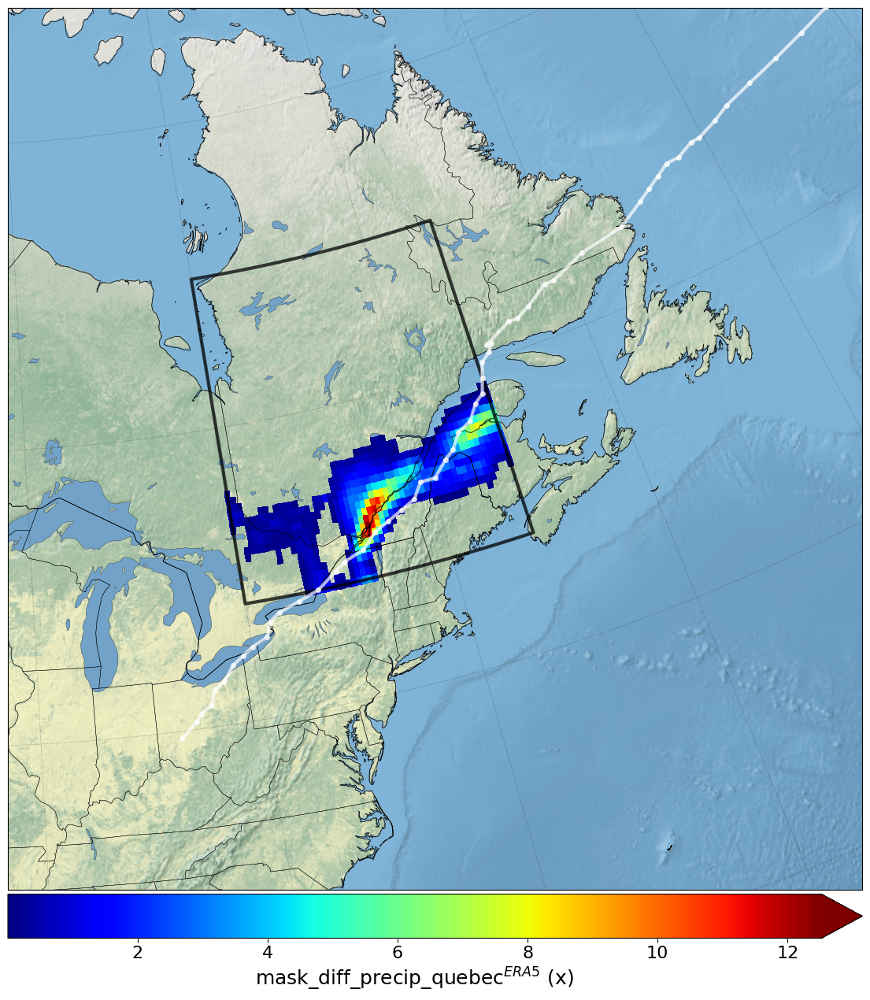

In [99]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

cmap = plt.get_cmap('jet')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(mask_diff_precip_quebec[coord_lon2], mask_diff_precip_quebec[coord_lat2],
                   mask_diff_precip_quebec.sel(quantile=0.99).isel(time=7300).pr, cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'mask_diff_precip_quebec$^{ERA5}$ (x)', fontsize=18)
    
ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

In [119]:
# storm = df.groupby('storm').get_group(12820)

iEETC_list_precip = []
iEETC_list_wind = []
# iEETC_list_wind_SSI = []
iEETC_list_compound_quantile = []

drop_boolean = False if metric == 'ratio' else True #important to keep all values across the quebec domain for the ratio metric because we add +1 to all grid points of iEETC_precip/wind_exc in the calculation of the metric
    
for itrack, row in storm.iterrows():        
    ilon, ilat, itime = row['lon'], row['lat'], row['date']

    #select the 1000km radius around the storm position at itime to get the exceedance values only in that area
    mask_itime_precip = mask_diff_precip_quebec.sel(time=itime).where(mask_diff_precip_quebec.sel(time=itime).map(lambda x: haversine(ilon, ilat, getattr(x, coord_lon), getattr(x, coord_lat)) <= 1000), drop=drop_boolean).pr
    mask_itime_wind   = mask_diff_wind_quebec.sel(time=itime).where(mask_diff_wind_quebec.sel(time=itime).map(lambda x: haversine(ilon, ilat, getattr(x, coord_lon), getattr(x, coord_lat)) <= 1000), drop=drop_boolean).surf_wind #value at itime
    
    #for SSI calculation, we take the max wind within +/-12h of itime, as Ting-Chen et al. (2025) did
    time_slice = slice(itime - pd.Timedelta(hours=12), itime + pd.Timedelta(hours=12))
    # mask_itime_wind_SSI = mask_diff_wind_SSI_quebec.sel(time=time_slice).where(mask_diff_wind_SSI_quebec.sel(time=time_slice).map(lambda x: haversine(ilon, ilat, getattr(x, coord_lon), getattr(x, coord_lat)) <= 1000), drop=True).surf_wind.max(dim='time').expand_dims(time=[itime]) #max within +/-12h of itime for SSI calculation

    #for compound, we check within +/-8h of itime
    time_slice_compound = slice(itime - pd.Timedelta(hours=8), itime + pd.Timedelta(hours=8))
    mask_wind_cum_8hr = mask_diff_wind_quebec.sel(time=time_slice_compound).where(mask_diff_wind_quebec.sel(time=time_slice_compound).map(lambda x: haversine(ilon, ilat, getattr(x, coord_lon), getattr(x, coord_lat)) <= 1000), drop=True).surf_wind.sum(dim='time') 
    compound_quantile_8hrs = (mask_itime_precip > 0) & (mask_wind_cum_8hr > 0) #Si dans les 8 heures d'une précip > quantile il y'a des coordonnées lat/lon pour lesquels le vent était > quantile ça retourne True
                            
    iEETC_list_precip.append(mask_itime_precip)
    iEETC_list_wind.append(mask_itime_wind)
    # iEETC_list_wind_SSI.append(mask_itime_wind_SSI)            
    iEETC_list_compound_quantile.append(compound_quantile_8hrs)  

In [120]:
iEETC_precip = xr.concat(iEETC_list_precip, dim='time', join="outer", coords="different", compat="equals") 
iEETC_wind = xr.concat(iEETC_list_wind, dim='time', join="outer", coords="different", compat="equals")
# iEETC_wind_SSI = xr.concat(iEETC_list_wind_SSI, dim='time', join="outer", coords="different", compat="equals")
iEETC_compound_quantile = xr.concat(iEETC_list_compound_quantile, dim='time', join="outer", coords="different", compat="equals")

iEETC_precip_exc = iEETC_precip.sum(dim=['time']) 
iEETC_wind_exc = iEETC_wind.sum(dim=['time'])

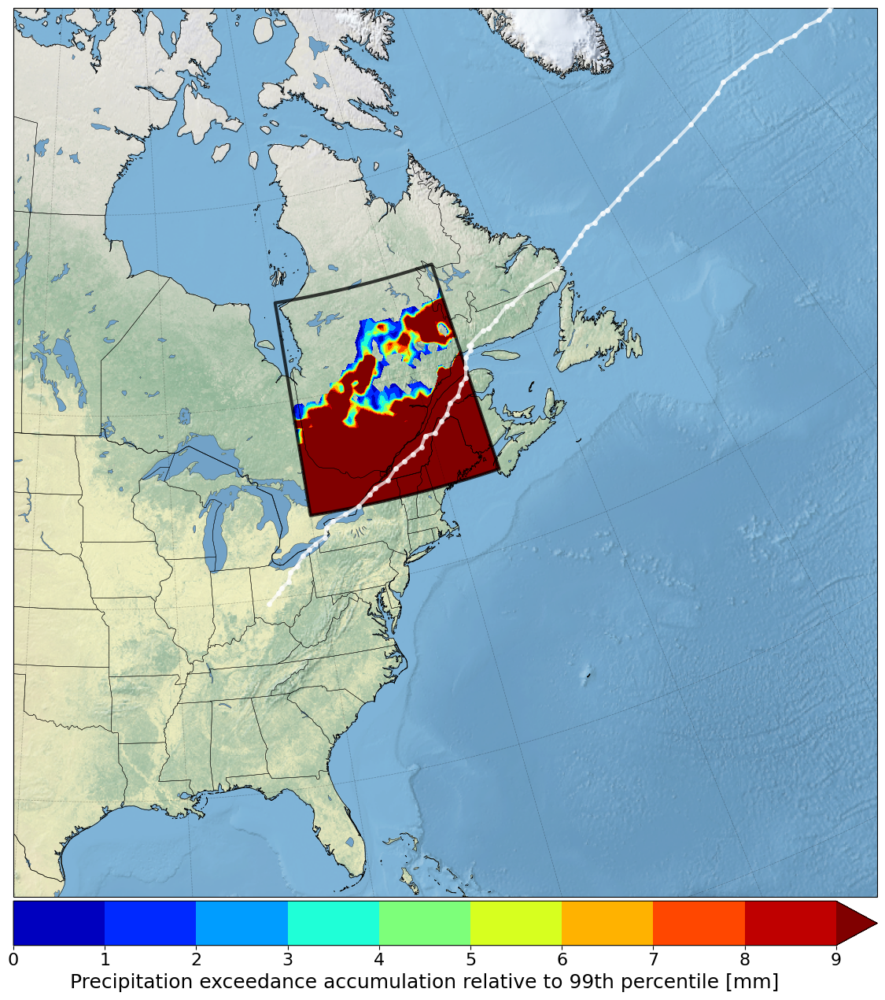

In [125]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-100, -50, 65, 25], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

cmap = plt.get_cmap('jet')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

# sc = ax.pcolormesh(iEETC_precip_exc[coord_lon2], iEETC_precip_exc[coord_lat2],
#                    iEETC_precip_exc.sel(quantile=0.99).where(iEETC_precip_exc.sel(quantile=0.99) > 0.), cmap=cmap, transform=crs)

sc = ax.contourf(iEETC_wind_exc[coord_lon2], iEETC_wind_exc[coord_lat2],
                   iEETC_wind_exc.sel(quantile=0.99).where(iEETC_wind_exc.sel(quantile=0.99) > 0.), extend='max', levels=np.arange(0,10,1), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, aspect=30)
cb.ax.tick_params(labelsize=16)
cb.set_label('Precipitation exceedance accumulation relative to 99th percentile [mm]', fontsize=18)

ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

In [126]:
#ICI IL FAUT SÉLECTIONNER LA RÉGION POUR AVOIR LES MÉTRIQUES DE LA RÉGION QUEBEC
# test_quebec_affecte_precip = iEETC_precip_exc.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(south_lat, north_lat)}).sum(dim=[coord_lon2, coord_lat2])
# test_quebec_affecte_vent = iEETC_wind_exc.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(south_lat, north_lat)}).sum(dim=[coord_lon2, coord_lat2])
if metric == 'ratio':
    iEETC_precip_exc = iEETC_precip_exc + 1
    iEETC_wind_exc   = iEETC_wind_exc   + 1
test_quebec_affecte_precip = iEETC_precip_exc.sum(dim=[coord_lon2, coord_lat2])
test_quebec_affecte_vent   = iEETC_wind_exc.sum(dim=[coord_lon2, coord_lat2])
test_quebec_affecte_vent

<xarray.DataArray 'surf_wind' (quantile: 4)> Size: 16B
dask.array<sum-aggregate, shape=(4,), dtype=float32, chunksize=(4,), chunktype=numpy.ndarray>
Coordinates:
  * quantile  (quantile) float64 32B 0.98 0.99 0.995 0.999

In [127]:
# iEETC_wind_SSI_max = iEETC_wind_SSI.max(dim=['time']) #we take the max of the wind within 1000km of the stormtrack
# SSI_map = (iEETC_wind_SSI_max - 1)**3 #we compute the SSI for the wind
# # SSI = SSI_map.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(south_lat, north_lat)}).where(SSI_map.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(south_lat, north_lat)}) > 0).sum(dim=(coord_lon2, coord_lat2)) / Quebec_nb_gridbox
# SSI = SSI_map.where(SSI_map > 0).sum(dim=(coord_lon2, coord_lat2)) / Quebec_nb_gridbox

#on calcule le nombre de pas de temps avec une précipitation excédente sur chaque point de grille
iEETC_precip_dur = iEETC_precip.where(iEETC_precip > 0).count(dim='time')
iEETC_wind_dur = iEETC_wind.where(iEETC_wind > 0).count(dim='time')

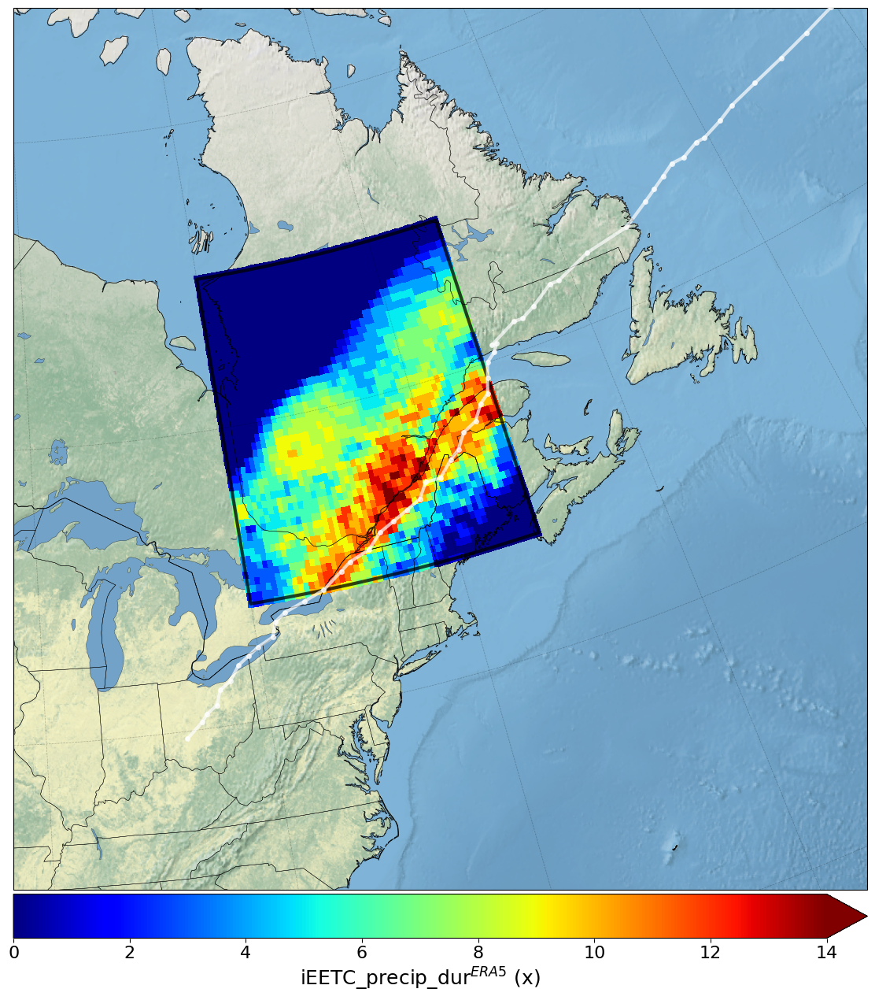

In [128]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

cmap = plt.get_cmap('jet')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(iEETC_precip_dur[coord_lon2], iEETC_precip_dur[coord_lat2],
                   iEETC_precip_dur.sel(quantile=0.99), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'iEETC_precip_dur$^{ERA5}$ (x)', fontsize=18)

ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

In [129]:
#on calcule la précipitation excédente moyenne par heure avec une précipitation excédente
iEETC_precip_avexc = (iEETC_precip_exc / iEETC_precip_dur).where(iEETC_precip_dur != 0)
iEETC_wind_avexc = (iEETC_wind_exc / iEETC_wind_dur).where(iEETC_wind_dur != 0)

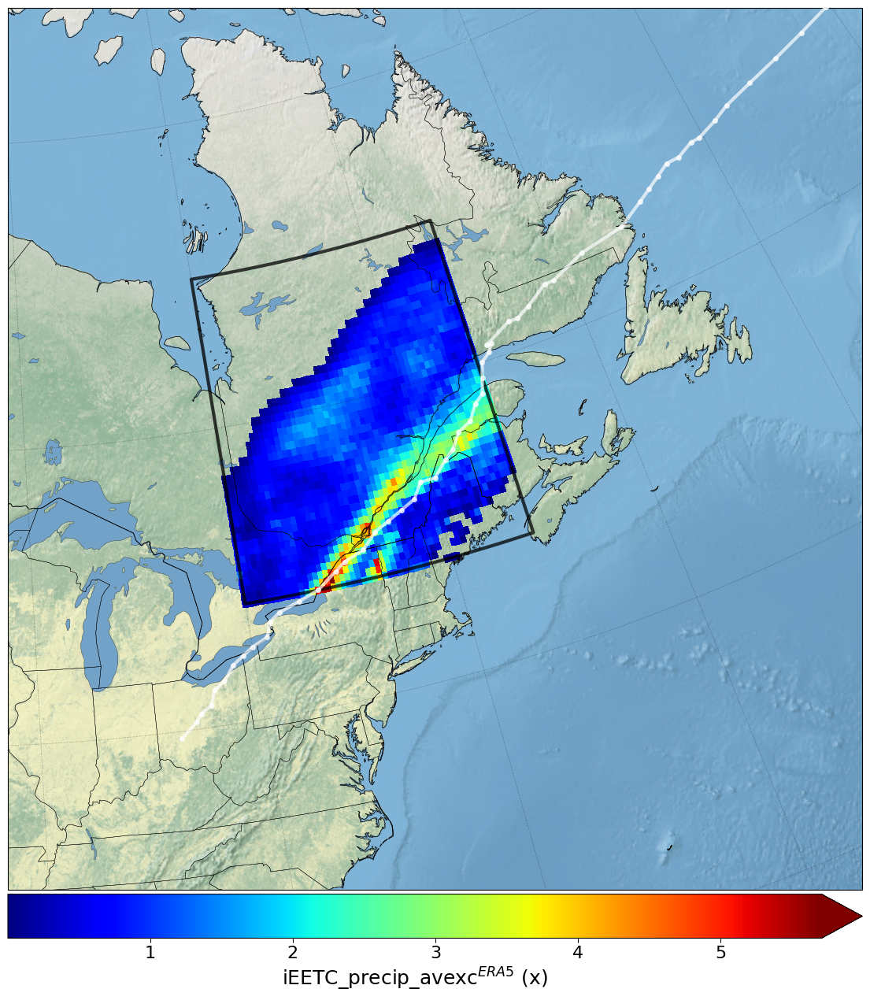

In [130]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

cmap = plt.get_cmap('jet')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(iEETC_precip_avexc[coord_lon2], iEETC_precip_avexc[coord_lat2],
                   iEETC_precip_avexc.sel(quantile=0.99), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'iEETC_precip_avexc$^{ERA5}$ (x)', fontsize=18)

ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

In [134]:
#on calcule la précipitation excédente moyenne par point de grille de la région quebec
iEETC_precip_exc_tot = test_quebec_affecte_precip / Quebec_nb_gridbox 
iEETC_wind_exc_tot = test_quebec_affecte_vent / Quebec_nb_gridbox
iEETC_wind_exc_tot

<xarray.DataArray 'surf_wind' (quantile: 4)> Size: 16B
dask.array<truediv, shape=(4,), dtype=float32, chunksize=(4,), chunktype=numpy.ndarray>
Coordinates:
  * quantile  (quantile) float64 32B 0.98 0.99 0.995 0.999

In [132]:
#on calcule la précipitation excédente moyenne par heure moyenne par point de grille de la région quebec
# iEETC_precip_avexc_tot = iEETC_precip_avexc.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(south_lat, north_lat)}).sum(dim=[coord_lon2, coord_lat2]) / Quebec_nb_gridbox 
# iEETC_wind_avexc_tot = iEETC_wind_avexc.sel({'longitude': slice(west_lon, east_lon), 'latitude': slice(south_lat, north_lat)}).sum(dim=[coord_lon2, coord_lat2]) / Quebec_nb_gridbox
if metric == 'ratio':
    iEETC_precip_avexc = iEETC_precip_avexc.fillna(0) + 1
    iEETC_wind_avexc = iEETC_wind_avexc.fillna(0) + 1
iEETC_precip_avexc_tot = iEETC_precip_avexc.sum(dim=[coord_lon2, coord_lat2]) / Quebec_nb_gridbox 
iEETC_wind_avexc_tot = iEETC_wind_avexc.sum(dim=[coord_lon2, coord_lat2]) / Quebec_nb_gridbox
iEETC_wind_avexc_tot

<xarray.DataArray 'surf_wind' (quantile: 4)> Size: 32B
dask.array<truediv, shape=(4,), dtype=float64, chunksize=(4,), chunktype=numpy.ndarray>
Coordinates:
  * quantile  (quantile) float64 32B 0.98 0.99 0.995 0.999

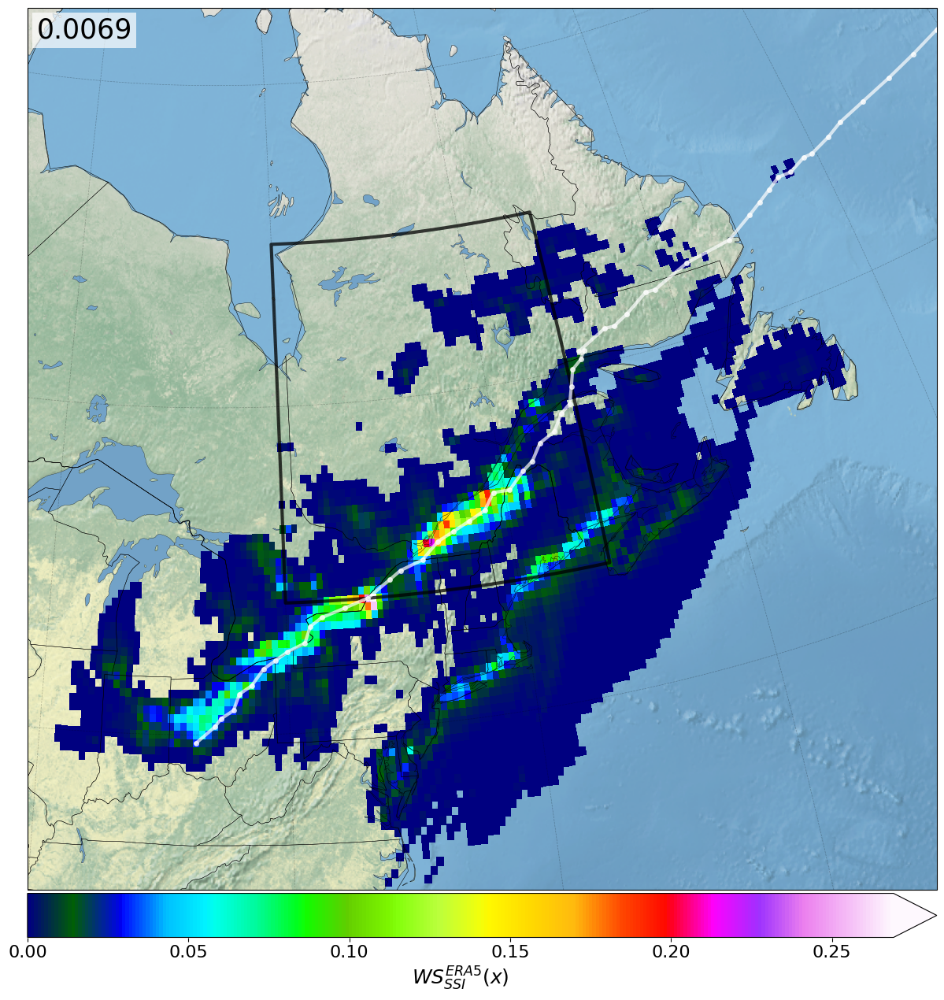

In [31]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=1, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

cmap = plt.get_cmap('gist_ncar')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(SSI_map[coord_lon2], SSI_map[coord_lat2],
                   SSI_map.sel(quantile=0.99).where(SSI_map.sel(quantile=0.99) > 0.), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'$WS_{SSI}^{ERA5} (x)$', fontsize=18)

ax.contourf(
    SSI_map[coord_lon2],
    SSI_map[coord_lat2],
    SSI_map.sel(quantile=0.99).where(SSI.sel(quantile=0.99) < 0),
    levels=[-np.inf, 0],
    hatches=['///'],
    colors='none',
    transform=crs,
    alpha=0
)

ax.text(
    0.01, 0.99,
    f"{np.round(SSI.sel(quantile=0.99).values.item(), 4)}",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)
    
ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

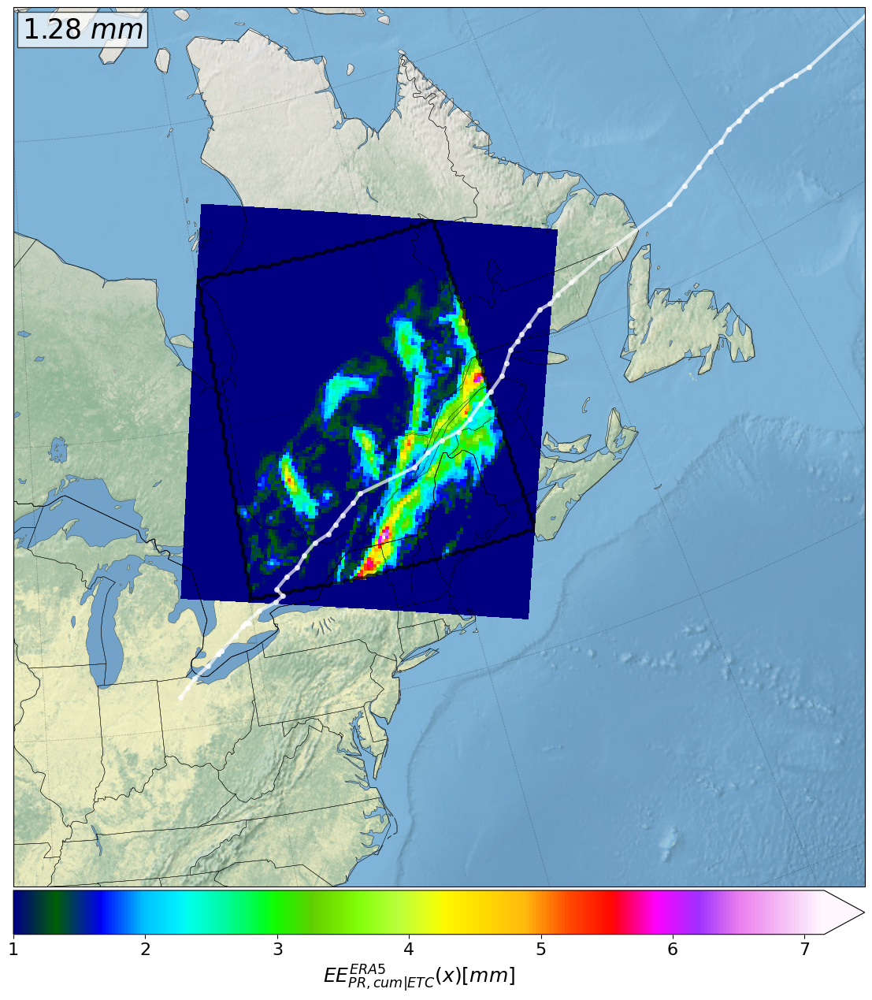

In [19]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=1, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

cmap = plt.get_cmap('gist_ncar')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(iEETC_precip_exc[coord_lon2], iEETC_precip_exc[coord_lat2],
                   iEETC_precip_exc.sel(quantile=0.99).where(iEETC_precip_exc.sel(quantile=0.99) > 0.), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'$EE_{PR,cum|ETC}^{ERA5}(x) [mm]$', fontsize=18)

ax.text(
    0.01, 0.99,
    f"{np.round(iEETC_precip_exc_tot.sel(quantile=0.99).values.item(), 2)} $mm$",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

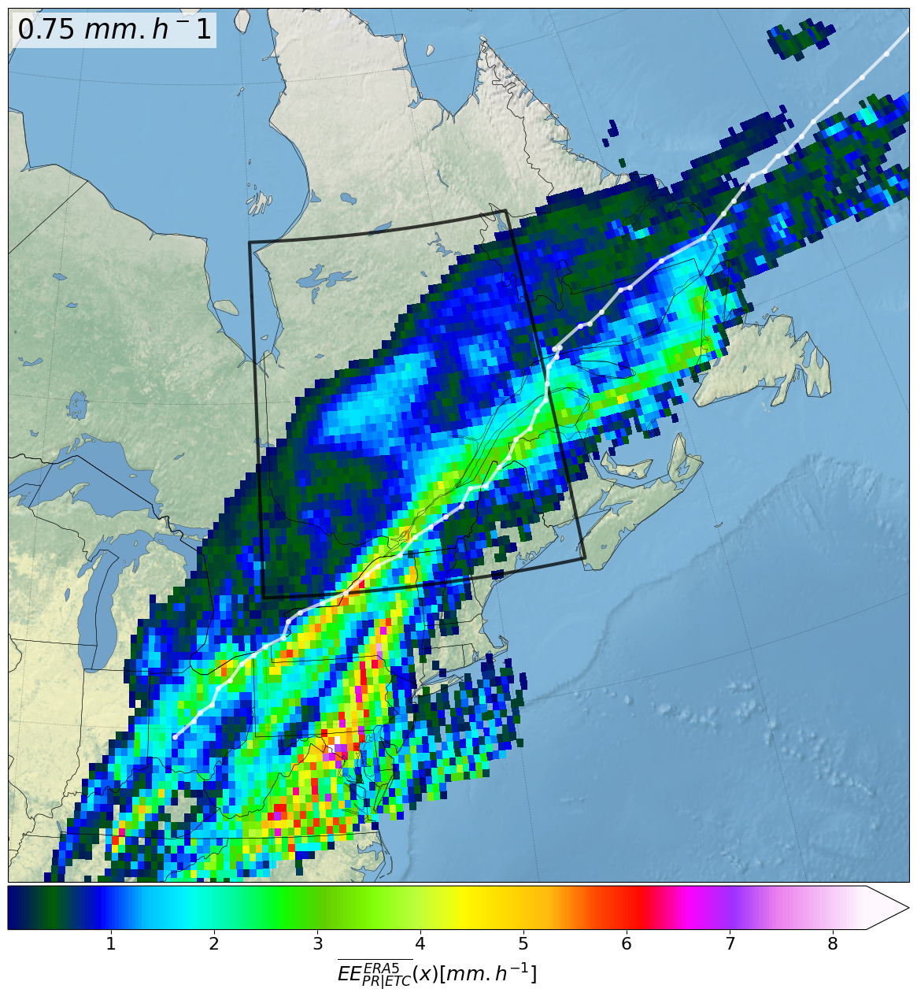

In [33]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=1, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

cmap = plt.get_cmap('gist_ncar')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(iEETC_precip_avexc[coord_lon2], iEETC_precip_avexc[coord_lat2],
                   iEETC_precip_avexc.sel(quantile=0.99).where(iEETC_precip_avexc.sel(quantile=0.99) > 0.), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'$\overline{EE_{PR|ETC}^{ERA5}}(x) [mm.h^{-1}]$', fontsize=18)

ax.text(
    0.01, 0.99,
    f"{np.round(iEETC_precip_avexc_tot.sel(quantile=0.99).values.item(), 2)} $mm.h^{-1}$",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

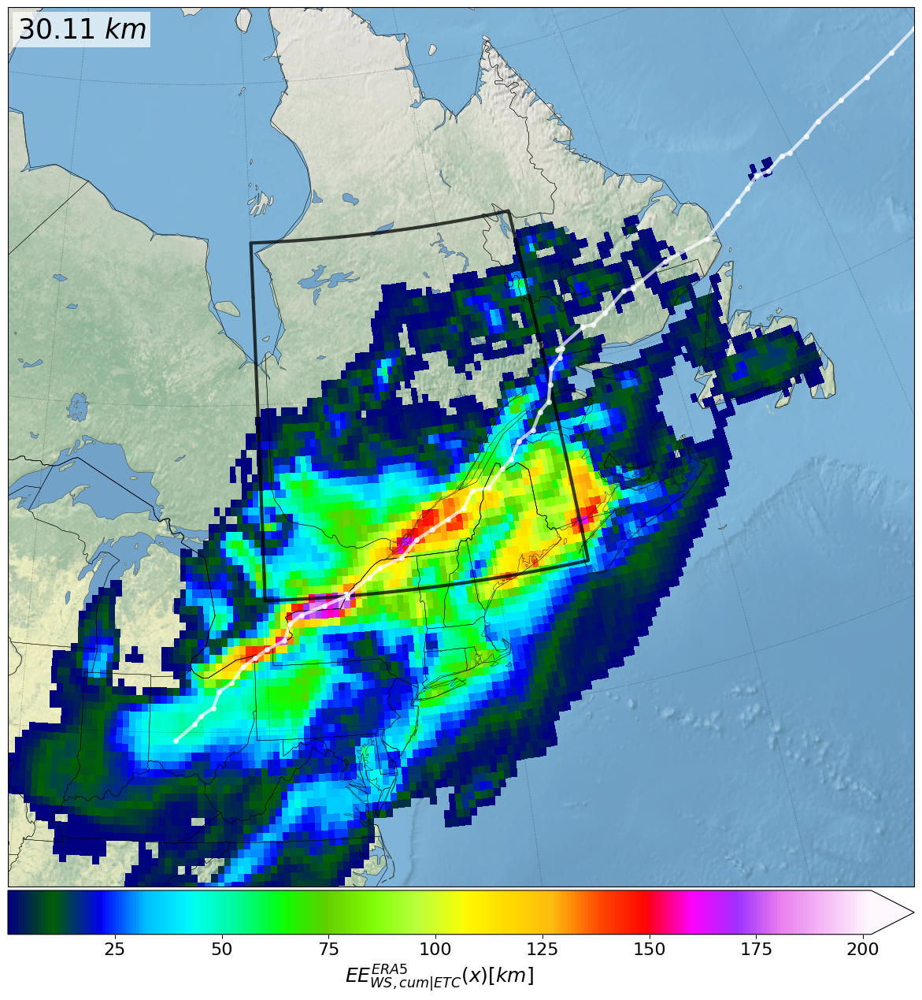

In [34]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=1, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

cmap = plt.get_cmap('gist_ncar')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(iEETC_wind_exc[coord_lon2], iEETC_wind_exc[coord_lat2],
                   iEETC_wind_exc.sel(quantile=0.99).where(iEETC_wind_exc.sel(quantile=0.99) > 0.), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'$EE_{WS,cum|ETC}^{ERA5}(x) [km]$', fontsize=18)

ax.text(
    0.01, 0.99,
    f"{np.round(iEETC_wind_exc_tot.sel(quantile=0.99).values.item(), 2)} $km$",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)

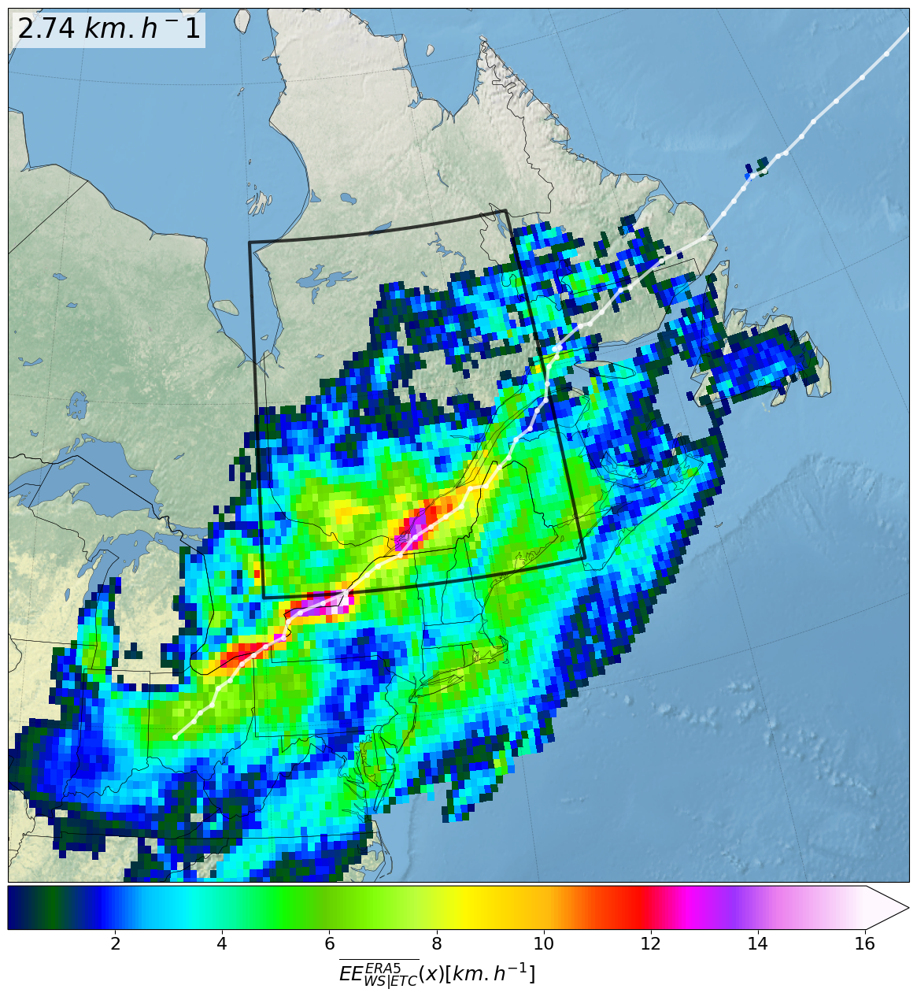

In [35]:
if sim != 'ERA5':
    pole_lon = ds_precip.rotated_pole.attrs['grid_north_pole_longitude']
    pole_lat = ds_precip.rotated_pole.attrs['grid_north_pole_latitude']
    crs = ccrs.RotatedPole(pole_longitude=pole_lon, pole_latitude=pole_lat)
else:
    crs = ccrs.PlateCarree()
    
    
plotcrs = ccrs.LambertConformal(central_latitude=45, central_longitude=-95)

fig, ax = plt.subplots(subplot_kw={'projection': plotcrs},
                       figsize=(12.5,12.5), tight_layout = {'pad': 0})

divider = make_axes_locatable(ax)
cax = divider.append_axes("bottom", size="5%", pad=0.05, axes_class=plt.Axes)

ax.set_extent([-90, -55, 60, 35], crs=ccrs.PlateCarree())

borders = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_0_boundary_lines_land', scale='50m', facecolor='none')
states_provinces = cartopy.feature.NaturalEarthFeature(category='cultural', name='admin_1_states_provinces', scale='50m', facecolor='none')
lakes = cartopy.feature.NaturalEarthFeature(category='physical', name='lakes', scale='50m', facecolor='#72a2c7')
img = plt.imread('/home/vdemeyer/TOOLS/NE1_50M_SR_W.tif')
ax.add_feature(borders, linewidth=0.5, edgecolor='black', zorder=2)
ax.add_feature(states_provinces, edgecolor='black', linewidth=0.3)
ax.add_feature(lakes, zorder=1, linewidth=0.2, edgecolor='black')
ax.coastlines(resolution='10m', linewidth=0.4, color='black')
ax.gridlines(linewidth=0.5, linestyle='--', color='k', alpha=0.25, xlocs=range(-180,180,10), ylocs=range(-90,90,10))
ax.imshow(img, origin='upper', extent=(-180, 180, -90, 90), transform=ccrs.PlateCarree())

# mtl_lon, mtl_lat = -73.561668, 45.508888
# ax.plot(mtl_lon, mtl_lat, marker='*', color='white', markersize=10, markeredgewidth=1, markeredgecolor='black', zorder=3, transform=ccrs.PlateCarree())

cmap = plt.get_cmap('gist_ncar')

ax.plot(storm['lon'], storm['lat'], transform=ccrs.PlateCarree(), lw=3, c='white', alpha=0.7, marker='o', markersize=4, zorder=3)

sc = ax.pcolormesh(iEETC_wind_avexc[coord_lon2], iEETC_wind_avexc[coord_lat2],
                   iEETC_wind_avexc.sel(quantile=0.99).where(iEETC_wind_avexc.sel(quantile=0.99) > 0.), cmap=cmap, transform=crs)

cb = fig.colorbar(sc, cax=cax, orientation="horizontal", pad=0.02, extend='max', aspect=40)
cb.ax.tick_params(labelsize=16)
cb.set_label(r'$\overline{EE_{WS|ETC}^{ERA5}}(x) [km.h^{-1}]$', fontsize=18)

ax.text(
    0.01, 0.99,
    fr"{np.round(iEETC_wind_avexc_tot.sel(quantile=0.99).values.item(), 2)} $km.h^{-1}$",
    transform=ax.transAxes,
    fontsize=25,
    verticalalignment='top',
    bbox=dict(facecolor='white', edgecolor='k', alpha=0.7)
)

ax.contour(
    Mask_NNA[coord_lon2],
    Mask_NNA[coord_lat2],
    Mask_NNA,
    levels=[0.99],
    linewidths=3,
    colors='black',
    alpha=0.75,
    transform=crs,
)